In [1]:
import os
os.chdir(r"../..")
print("Working directory set to:", os.getcwd())

Working directory set to: c:\Users\DELL\Desktop\collage\projects\solar_panel_eff_regression


Loading Files and libraries

In [2]:
import numpy as np
import pandas as pd

# Load the training and test datasets
train_df = pd.read_csv("dataset/train.csv")
test_df = pd.read_csv("dataset/test.csv")


## Training Data exploration


Data Summary of Training Data


In [ ]:
# Display the first few rows of the training dataset
print("Training dataset preview:")
print(train_df.head())

# Display shape and basic info of the training dataset
print("\nTraining dataset shape:", train_df.shape)
print("Training dataset info:")
print(train_df.info())

# Display discriptive statistics of the training dataset
print("\nTraining dataset descriptive statistics:")
print(train_df.describe())

#Display null values in the training dataset
print("\n null values in training dataset:")
print(train_df.isnull().sum())

# Display the unique values in the column
print("\nUnique values in  column:")
print(train_df.nunique())

# Display duplicates in the training dataset
print("\nDuplicates in training dataset:")
print(train_df.duplicated().sum())

Training dataset preview:
   id  temperature  irradiance            humidity  panel_age  \
0   0     7.817315  576.179270   41.24308670850264  32.135501   
1   1    24.785727  240.003973  1.3596482765960705  19.977460   
2   2    46.652695  687.612799   91.26536837560256   1.496401   
3   3    53.339567  735.141179   96.19095521176159  18.491582   
4   4     5.575374   12.241203  27.495073003585226  30.722697   

   maintenance_count  soiling_ratio    voltage   current  module_temperature  \
0                4.0       0.803199  37.403527  1.963787           13.691147   
1                8.0       0.479456  21.843315  0.241473           27.545096   
2                4.0       0.822398  48.222882  4.191800           43.363708   
3                3.0       0.837529  46.295748  0.960567           57.720436   
4                6.0       0.551833   0.000000  0.898062            6.786263   

   cloud_coverage          wind_speed            pressure string_id  \
0       62.494044   12.82491203

# Univariate Analysis (Single Variable)

1. Numerical Features

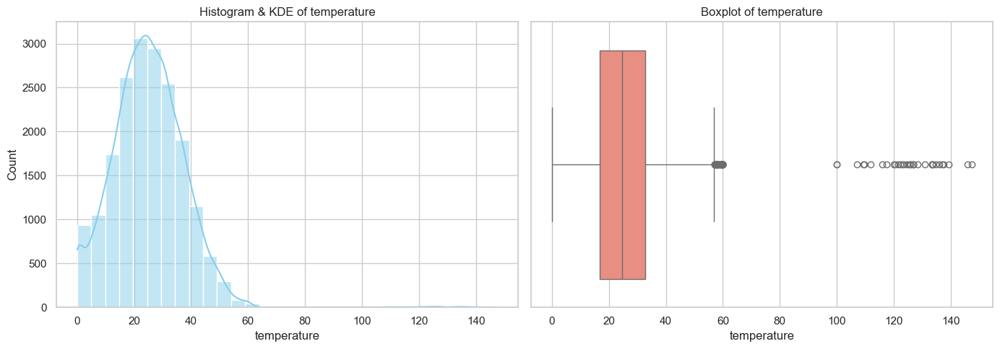

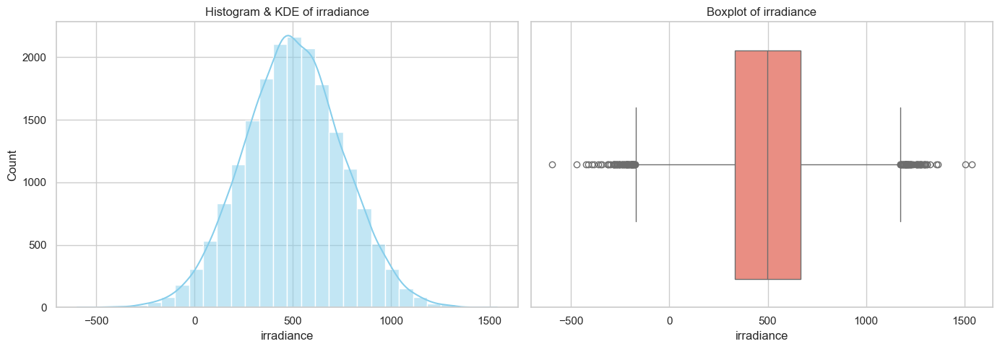

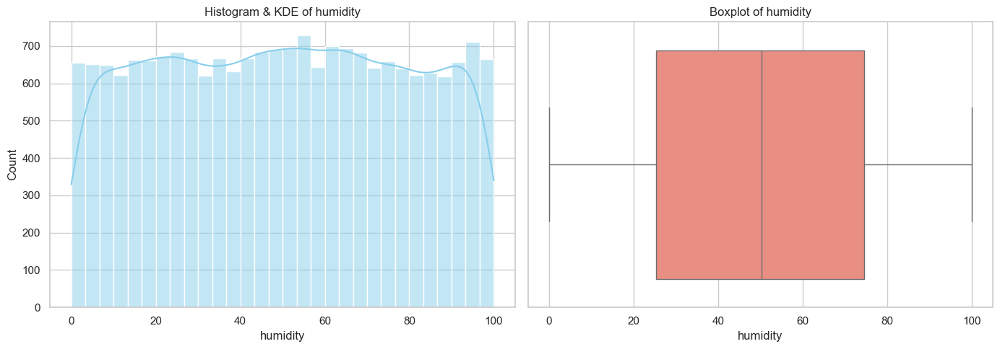

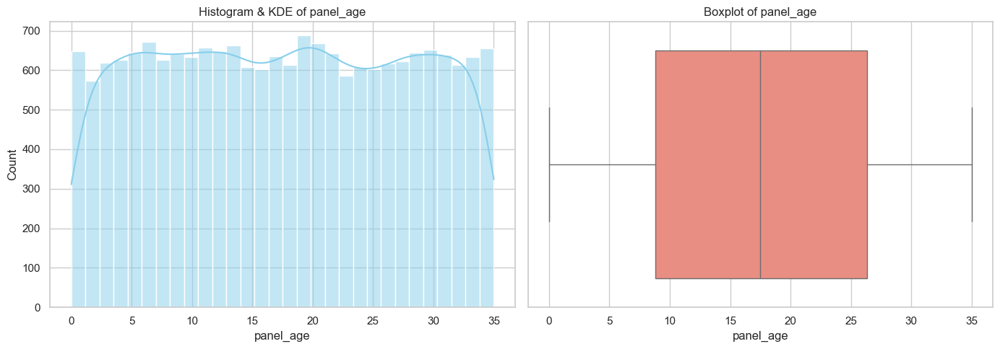

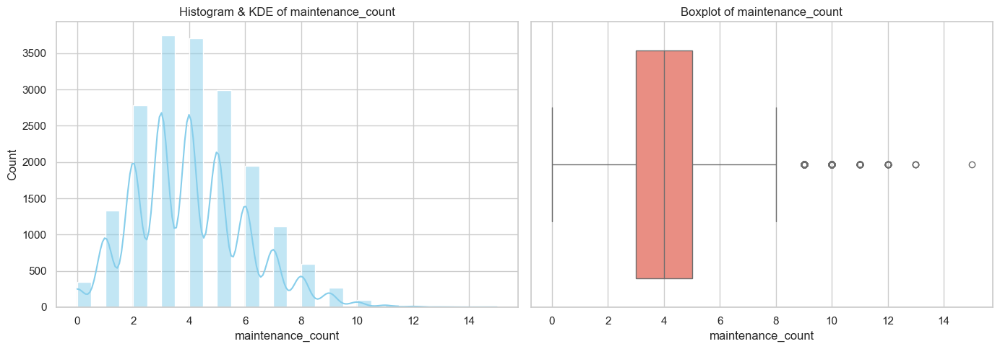

...

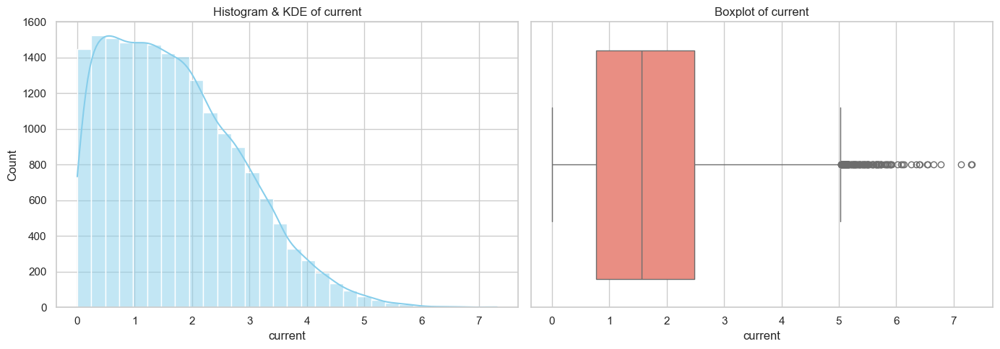

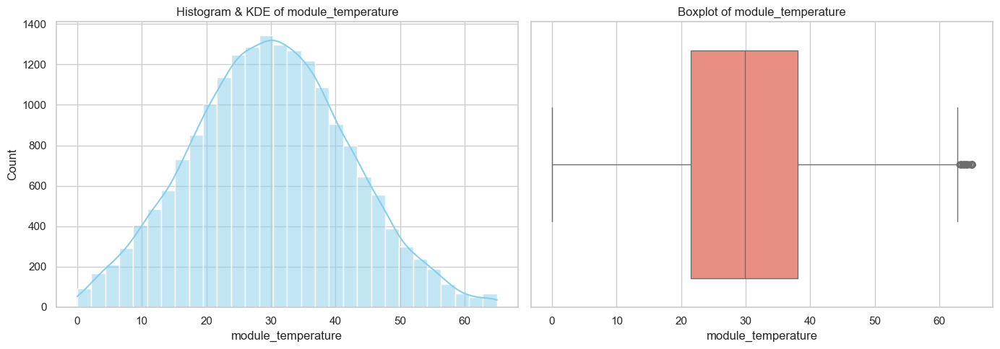

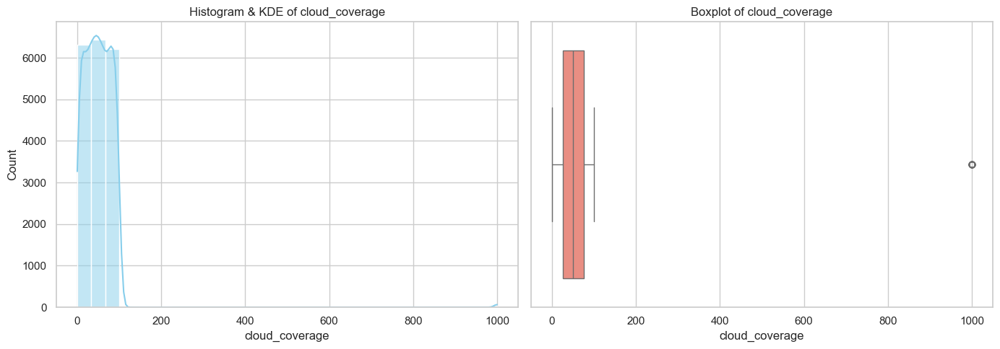

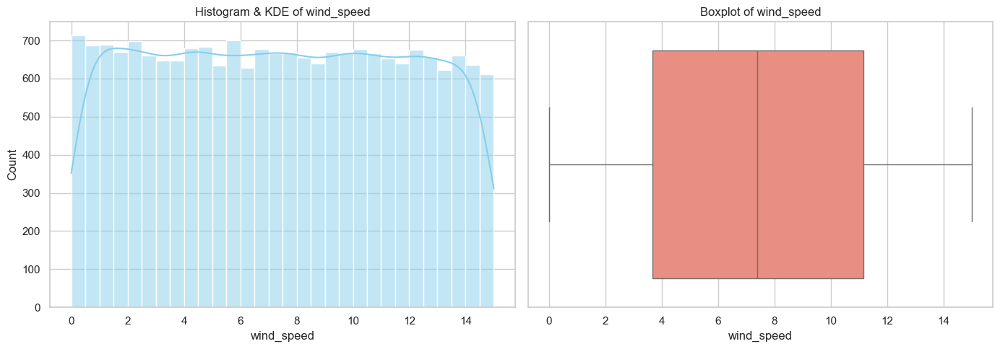

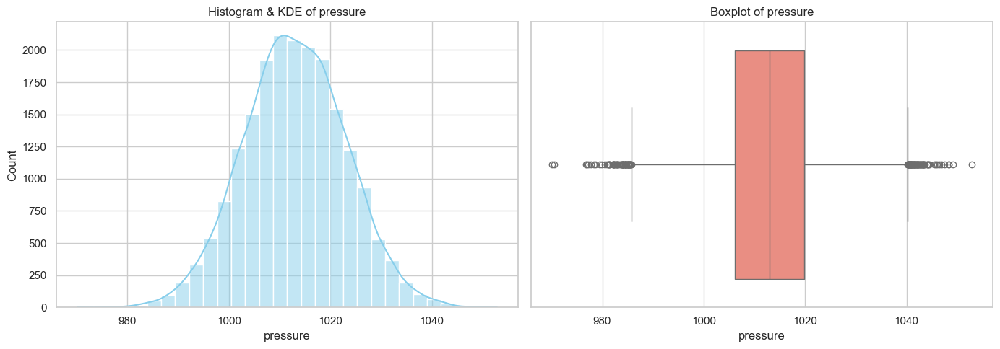

In [ ]:
# Univariate Analysis (Single Variable)
import matplotlib.pyplot as plt
import seaborn as sns

# Set Seaborn style
sns.set_theme(style="whitegrid")


numerical_cols = ['temperature','irradiance','humidity','panel_age','maintenance_count','soiling_ratio','voltage','current','module_temperature','cloud_coverage','wind_speed','pressure']

# convert columns to numeric, coercing errors to NaN
train_df['humidity'] = pd.to_numeric(train_df['humidity'], errors='coerce')
train_df['wind_speed'] = pd.to_numeric(train_df['wind_speed'], errors='coerce')
train_df['pressure'] = pd.to_numeric(train_df['pressure'], errors='coerce')

# Plot histograms with KDE and boxplots
for col in numerical_cols:
    plt.figure(figsize=(14, 5))

    # Histogram with KDE
    plt.subplot(1, 2, 1)
    sns.histplot(train_df[col], kde=True, bins=30, color='skyblue')
    plt.title(f'Histogram & KDE of {col}')

    # Boxplot
    plt.subplot(1, 2, 2)
    sns.boxplot(x=train_df[col], color='salmon')
    plt.title(f'Boxplot of {col}')

    plt.tight_layout()
    plt.show()




2. Categorical Features

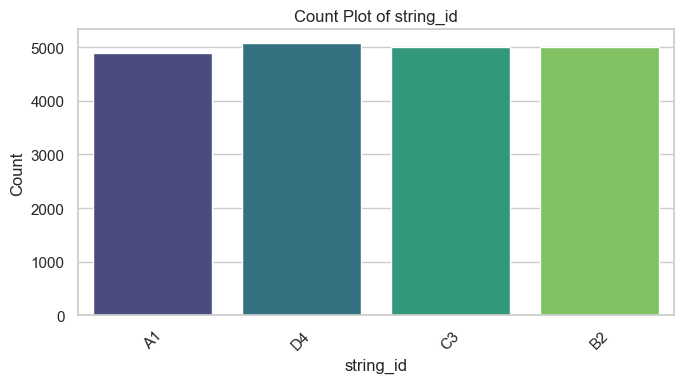

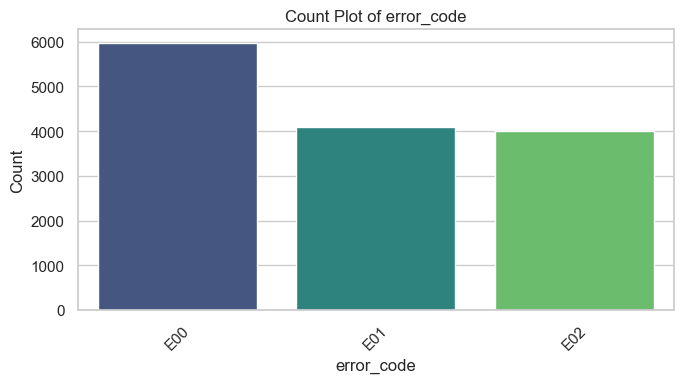

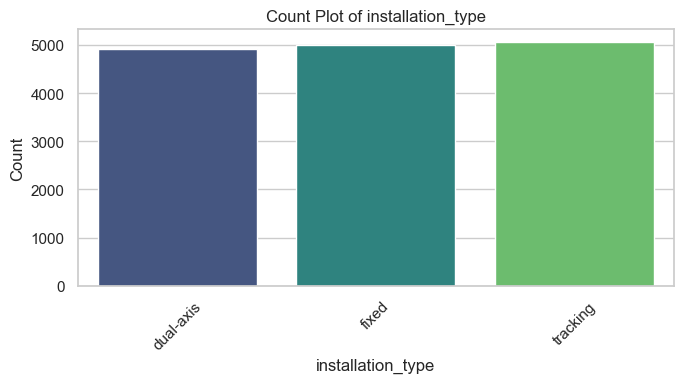

In [19]:
import matplotlib.pyplot as plt
import seaborn as sns

# set Seaborn style
sns.set_theme(style="whitegrid")

categorial_cols =['string_id','error_code' ,'installation_type']

# Plot count plots for categorical variables

for col in categorial_cols:
    plt.figure(figsize=(7,4))
    sns.countplot(data=train_df, x=col, hue =col, palette='viridis', legend= False)
    plt.xlabel(col)
    plt.ylabel('Count')
    plt.title(f'Count Plot of {col}')
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()


# Bivariate Analysis (Two Variables)

1. Correlation Heatmap (Numerical Features)

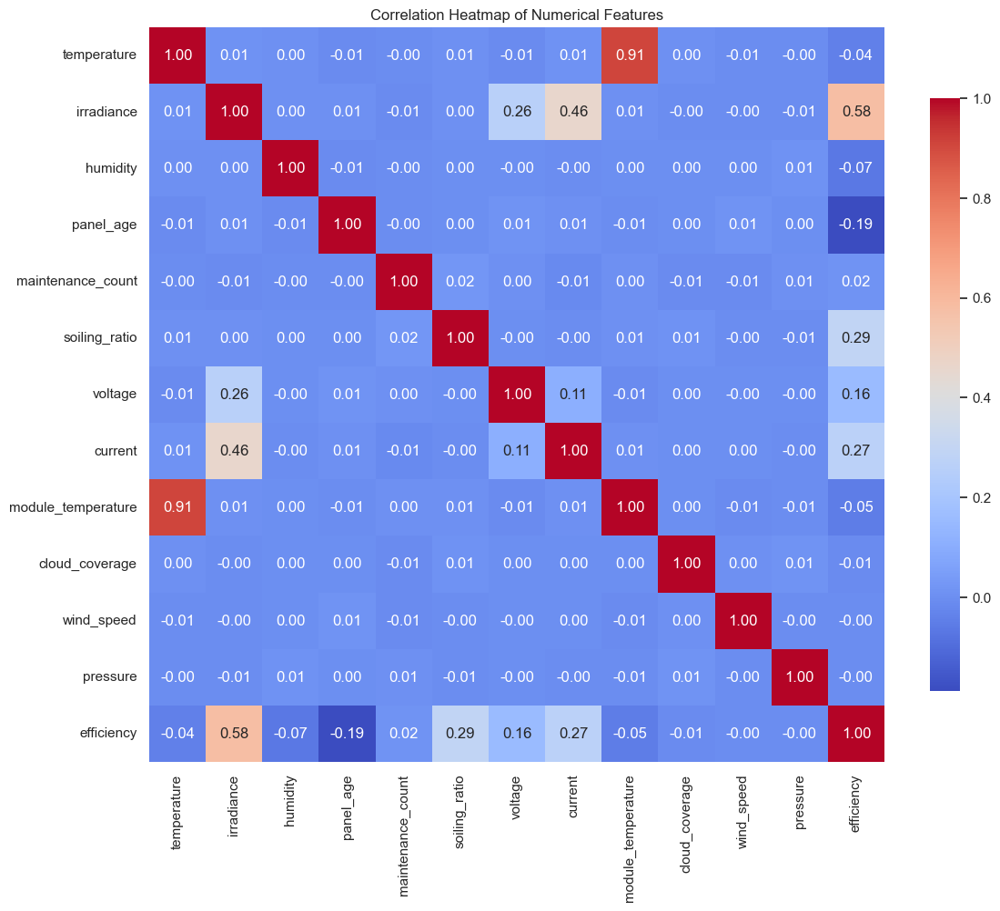

In [9]:
import matplotlib.pyplot as plt
import seaborn as sns

# Set Seaborn style
sns.set_theme(style="whitegrid")


# Define numerical columns for analysis
numerical_cols = ['temperature','irradiance','humidity','panel_age','maintenance_count','soiling_ratio','voltage','current','module_temperature','cloud_coverage','wind_speed','pressure','efficiency']

# convert columns to numeric, coercing errors to NaN
train_df['humidity'] = pd.to_numeric(train_df['humidity'], errors='coerce')
train_df['wind_speed'] = pd.to_numeric(train_df['wind_speed'], errors='coerce')
train_df['pressure'] = pd.to_numeric(train_df['pressure'], errors='coerce')

# correlation heatmap
plt.figure(figsize=(12, 10))
sns.heatmap(train_df[numerical_cols].corr(), annot=True, fmt=".2f", cmap='coolwarm', square=True, cbar_kws={"shrink": .8})
plt.title('Correlation Heatmap of Numerical Features')
plt.tight_layout()
plt.show()

2. Scatter Plots (Numerical vs Target)

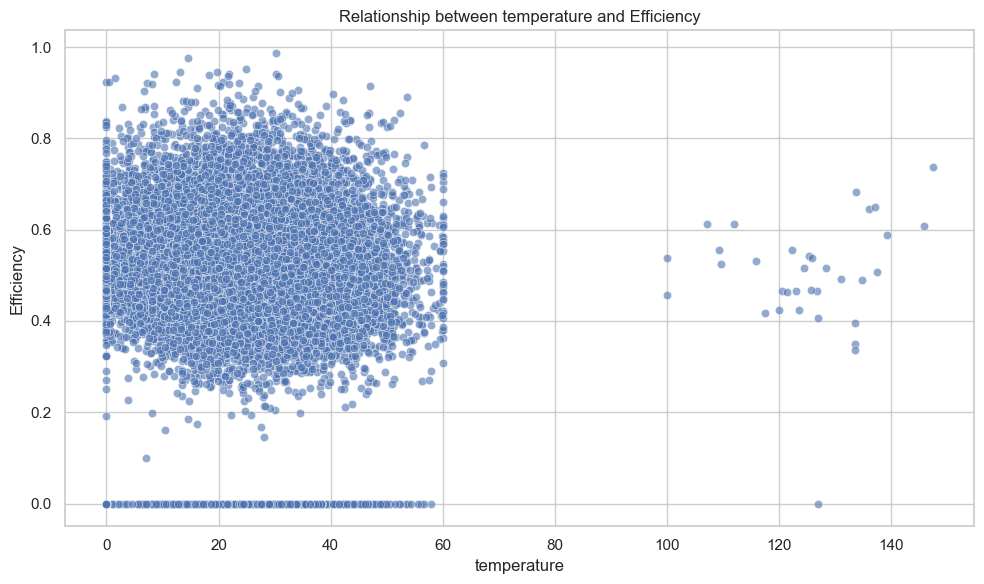

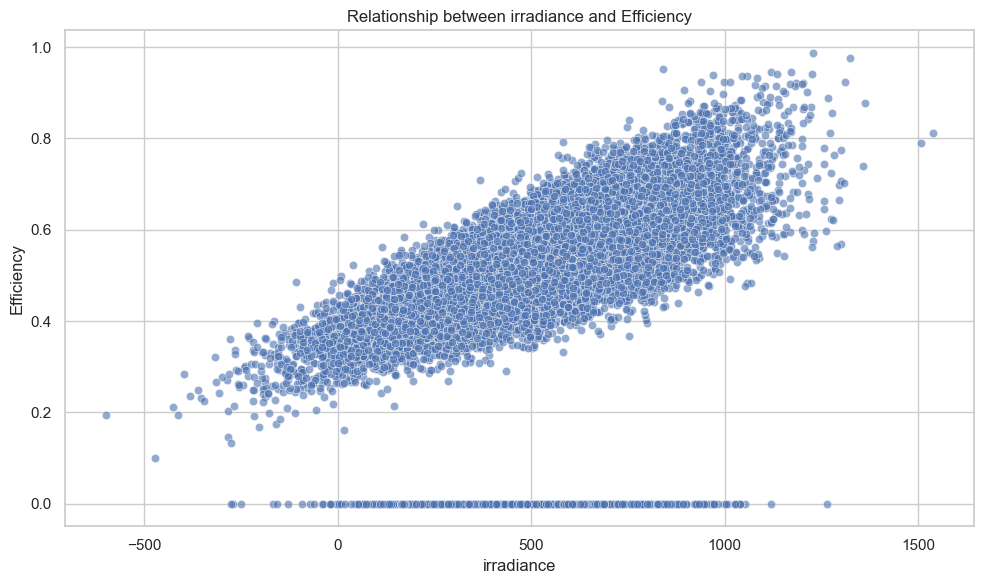

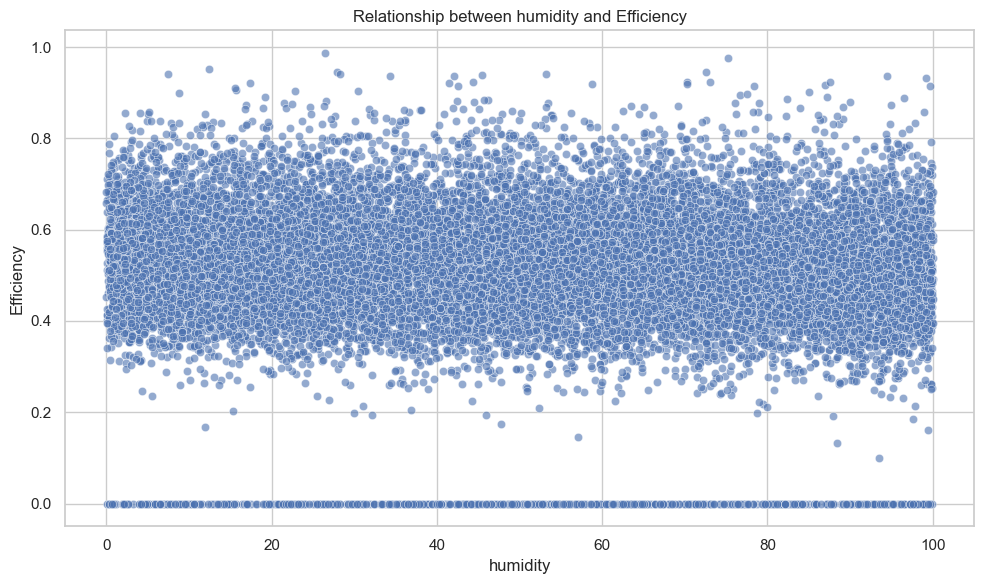

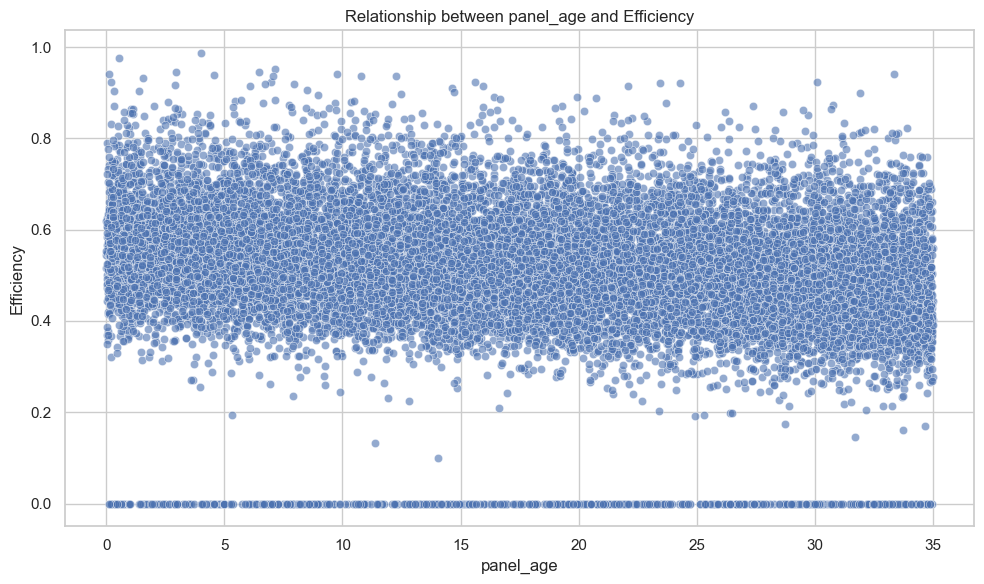

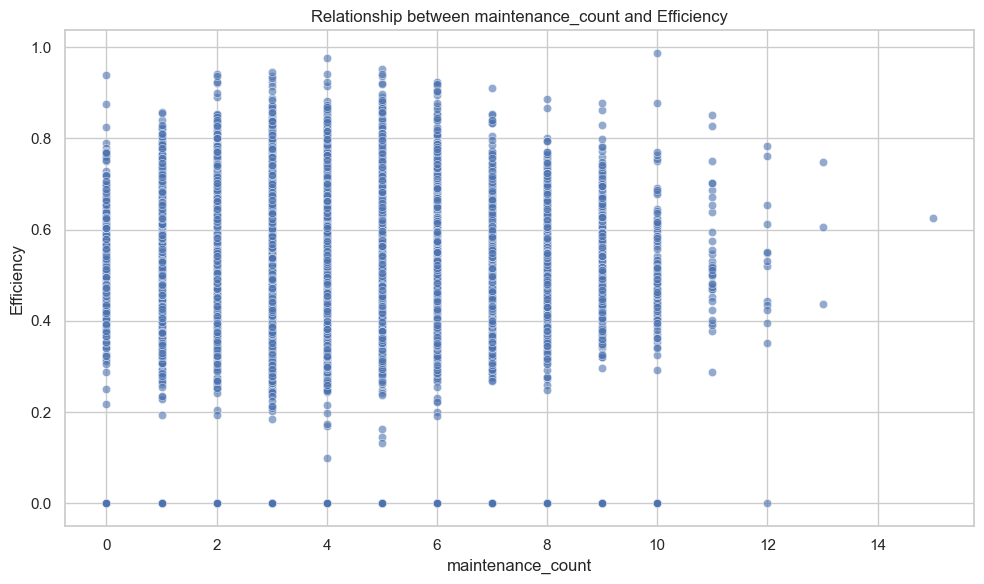

...

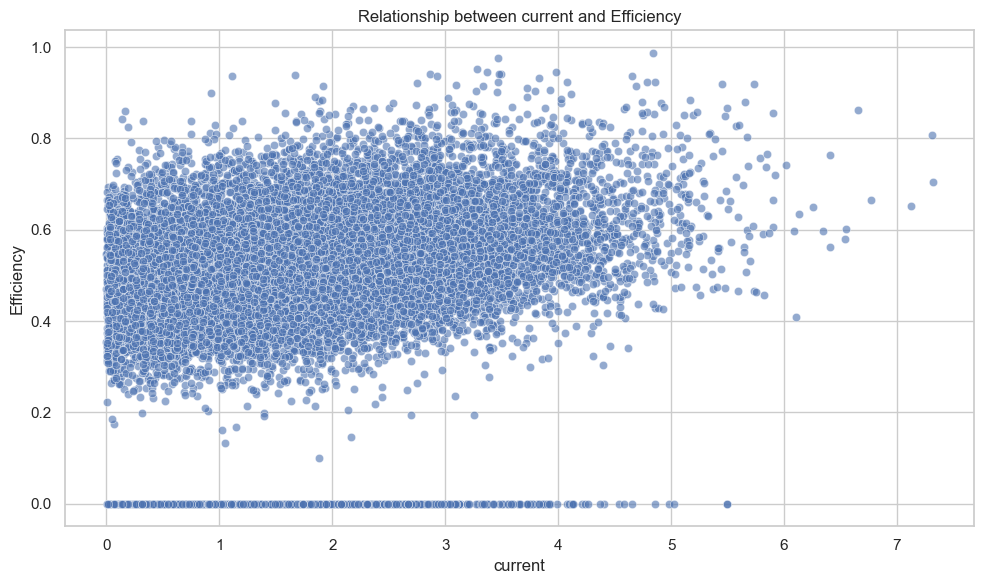

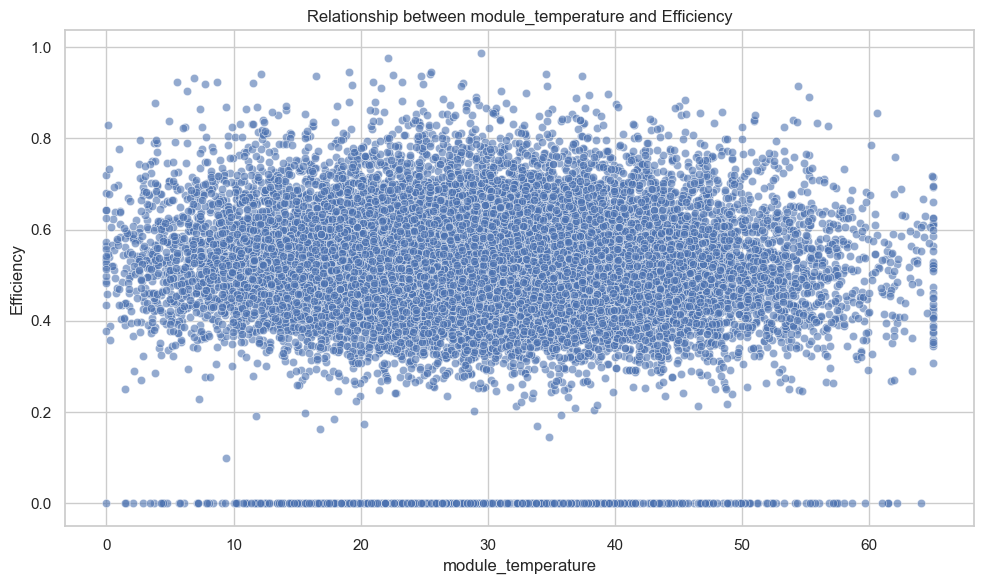

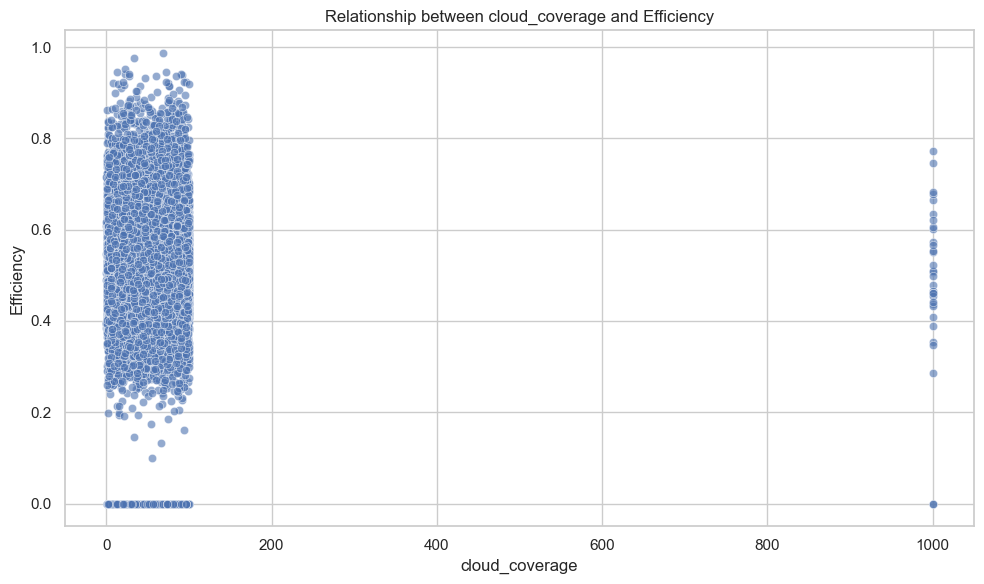

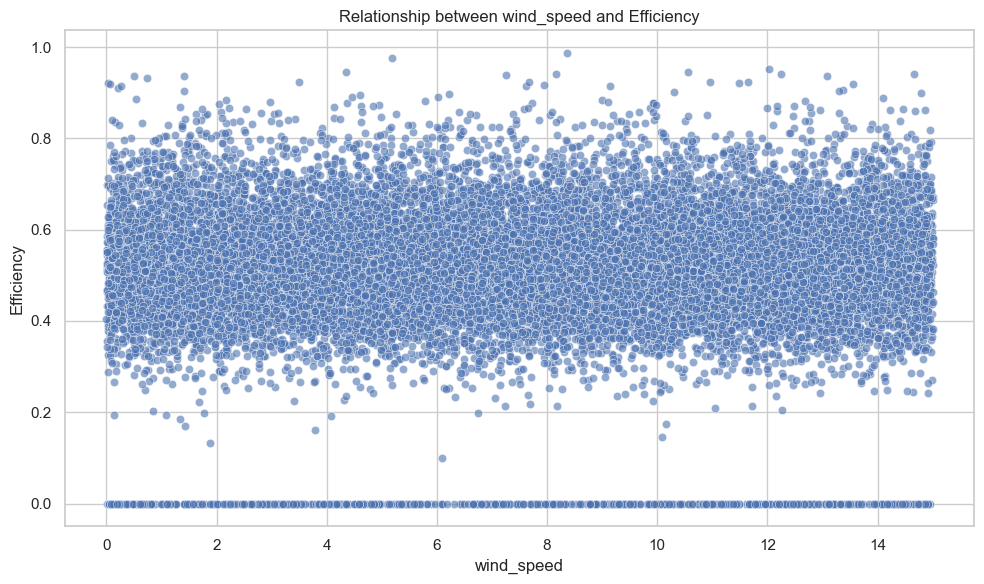

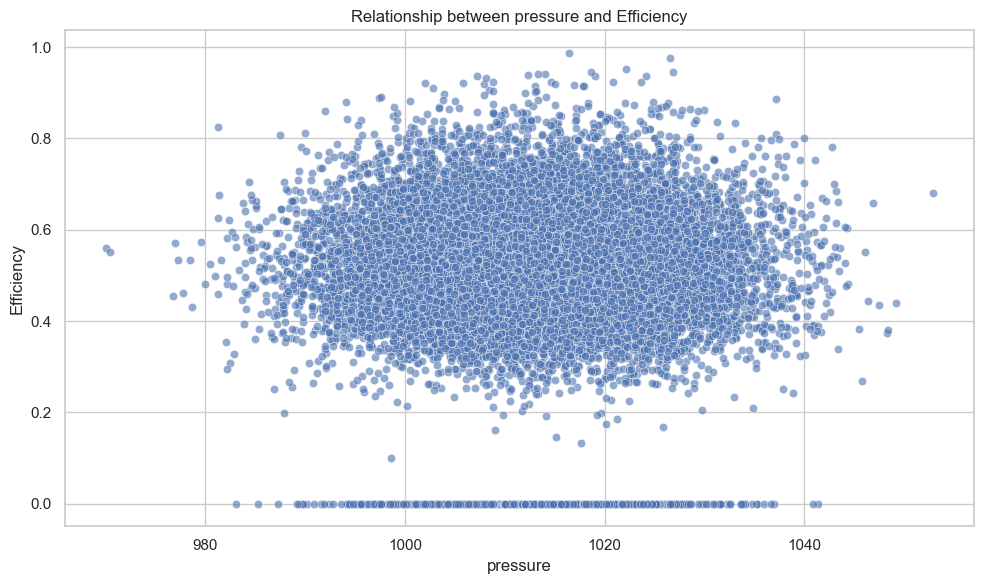

In [12]:
import matplotlib.pyplot as plt
import seaborn as sns

# set Seaborn style
sns.set_theme(style="whitegrid")

# Define numerical columns for analysis
numerical_cols = ['temperature','irradiance','humidity','panel_age','maintenance_count','soiling_ratio','voltage','current','module_temperature','cloud_coverage','wind_speed','pressure']

# convert columns to numeric, coercing errors to NaN
train_df['humidity'] = pd.to_numeric(train_df['humidity'], errors='coerce')
train_df['wind_speed'] = pd.to_numeric(train_df['wind_speed'], errors='coerce')
train_df['pressure'] = pd.to_numeric(train_df['pressure'], errors='coerce')

# Shows the relationship pattern between variables and efficiency

for cols in numerical_cols:
    plt.figure(figsize=(10, 6))
    sns.scatterplot(data=train_df, x=cols, y='efficiency', alpha=0.6)
    plt.title(f'Relationship between {cols} and Efficiency')
    plt.xlabel(cols)
    plt.ylabel('Efficiency')
    plt.grid(True)
    plt.tight_layout()
    plt.show()

3. Boxplots (Categorical vs Target)

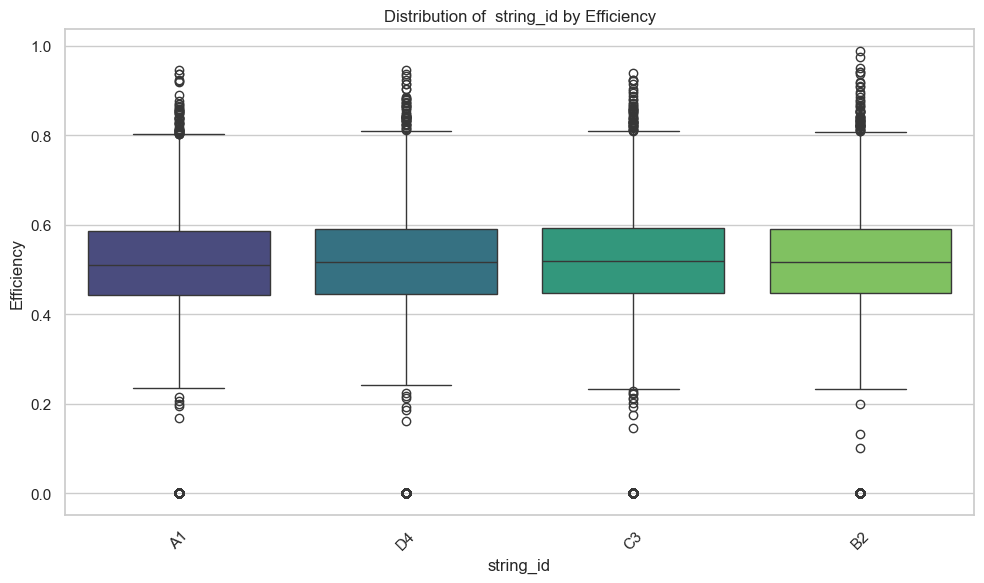

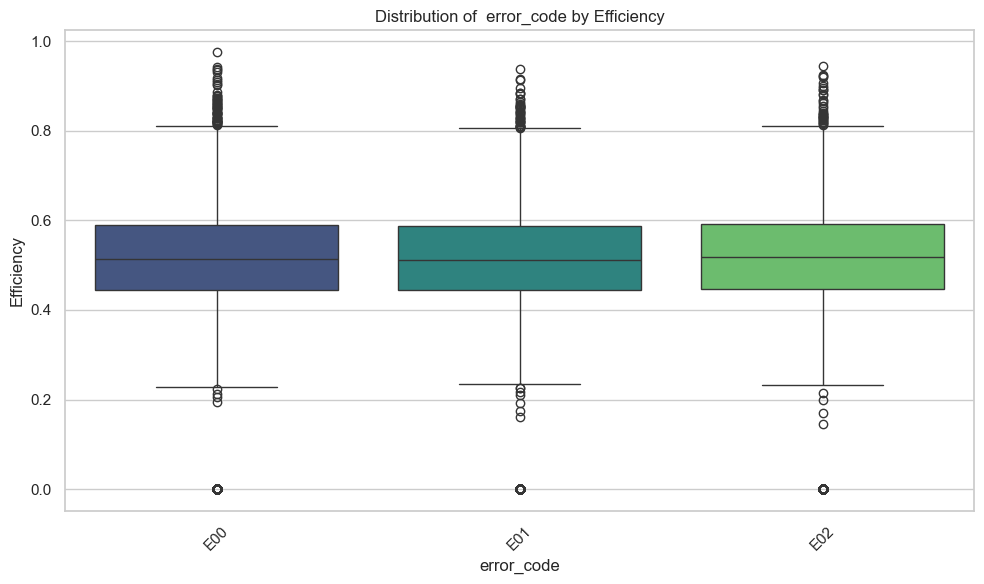

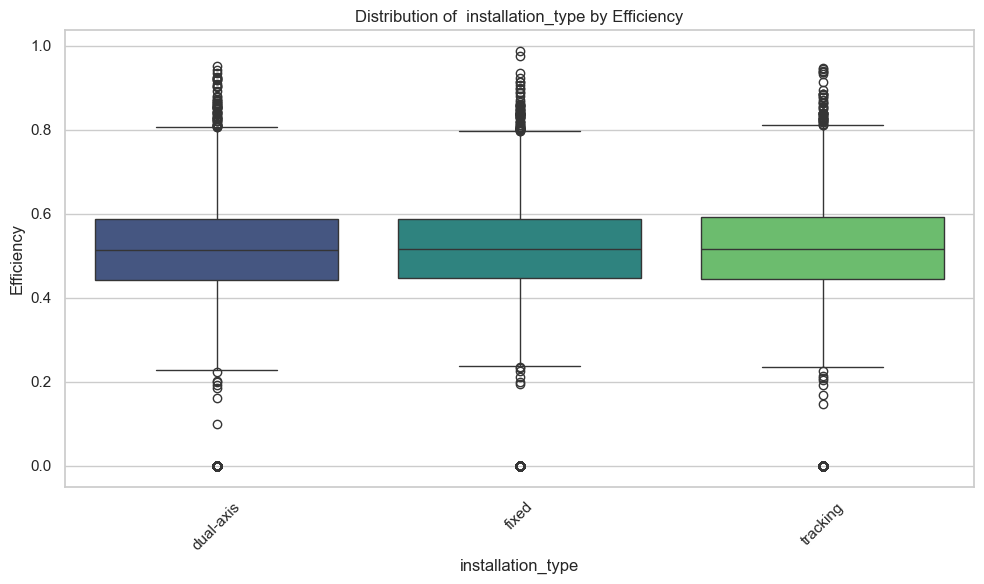

In [16]:
import matplotlib.pyplot as plt
import seaborn as sns

# Set Seaborn style
sns.set_theme(style="whitegrid")

# comparing distributions of efficiency across categories

categorial_cols =['string_id','error_code' ,'installation_type']

for col in categorial_cols:
    plt.figure(figsize=(10,6))
    sns.boxplot(data=train_df, x=col, y='efficiency', palette='viridis', hue=col, legend=False)
    plt.title(f'Distribution of  {col} by Efficiency')
    plt.xlabel(col)
    plt.ylabel('Efficiency')
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()

 4. Multivariate Analysis

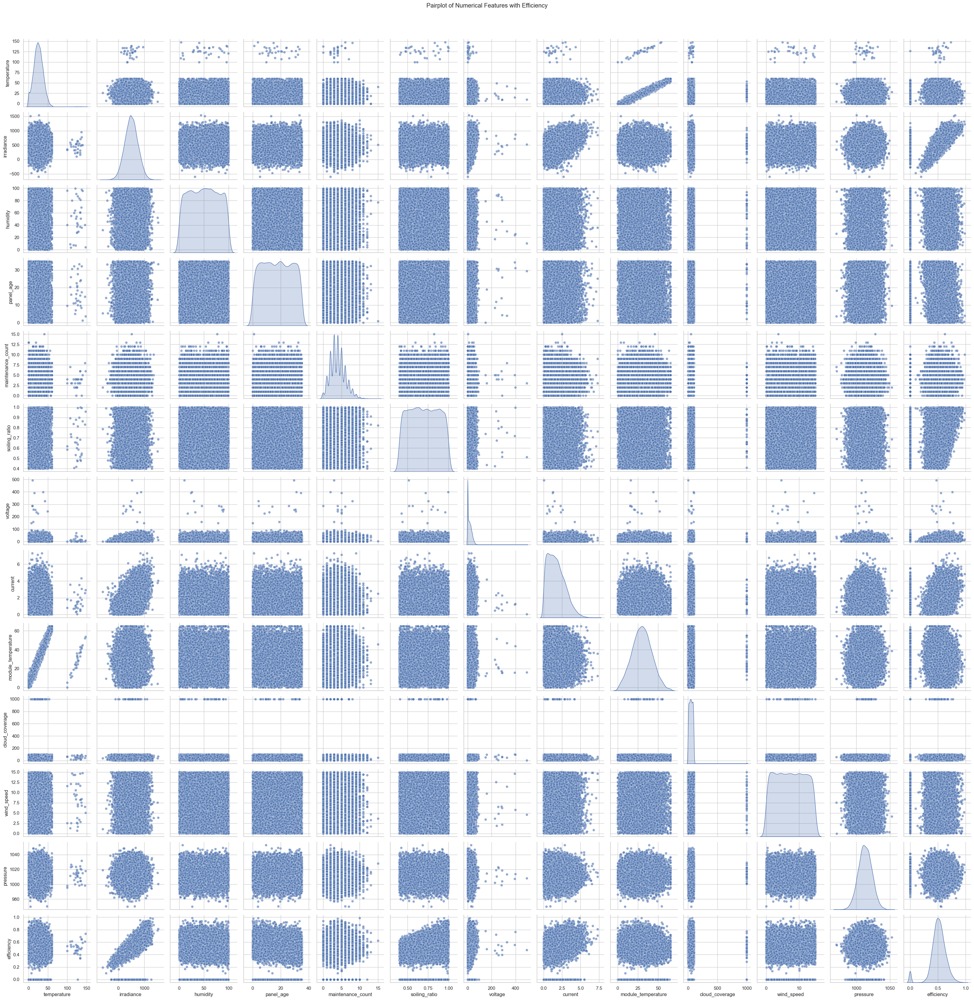

In [20]:
import matplotlib.pyplot as plt
import seaborn as sns

# Set Seaborn style
sns.set_theme(style="whitegrid")

# Define numerical columns for analysis
numerical_cols = ['temperature','irradiance','humidity','panel_age','maintenance_count','soiling_ratio','voltage','current','module_temperature','cloud_coverage','wind_speed','pressure']

# convert columns to numeric, coercing errors to NaN
train_df['humidity'] = pd.to_numeric(train_df['humidity'], errors='coerce')
train_df['wind_speed'] = pd.to_numeric(train_df['wind_speed'], errors='coerce')
train_df['pressure'] = pd.to_numeric(train_df['pressure'], errors='coerce')

# Pairplot to visualize relationships between numerical features
sns.pairplot(train_df[numerical_cols + ['efficiency']], diag_kind='kde', markers='o', plot_kws={'alpha': 0.6})
plt.suptitle('Pairplot of Numerical Features with Efficiency', y=1.02)
plt.tight_layout()
plt.show()


## Test Data exploration


Data Summary of Test Data

In [3]:
# Display the first few rows of the test dataset
print("Test dataset preview:")
print(test_df.head())

# Display shape and basic info of the test dataset
print("\nTest dataset shape:", test_df.shape)
print("Test dataset info:")
print(test_df.info())

# Display discriptive statistics of the test dataset
print("\nTest dataset descriptive statistics:")
print(test_df.describe())

#Display null values in the test dataset
print("\n null values in test dataset:")
print(test_df.isnull().sum())

# Display the unique values in the column
print("\nUnique values in  column:")
print(test_df.nunique())

# Display duplicates in the test dataset
print("\nDuplicates in test dataset:")
print(test_df.duplicated().sum())

Test dataset preview:
   id  temperature  irradiance           humidity  panel_age  \
0   0    17.618379   85.449838  90.81542277591531  13.910963   
1   1    34.826323  722.801748  20.98299301574633  20.916528   
2   2    33.776934  485.491998  55.61404977577451   1.446962   
3   3    18.584189  350.022720  49.04476645510075  18.810133   
4   4    43.044908  437.295622  8.761571340027164        NaN   

   maintenance_count  soiling_ratio    voltage   current  module_temperature  \
0                6.0       0.889765   6.370396  0.069101           19.517274   
1                4.0       0.590372  30.095867  1.713852           37.421443   
2                3.0       0.611425  28.424430  1.696936           32.147763   
3                5.0            NaN   7.848038  0.787188           25.734118   
4                8.0       0.564938  12.300717  1.867620                 NaN   

   cloud_coverage          wind_speed            pressure string_id  \
0       33.509889  7.1819582155525445   1

# Univariate Analysis (Single Variable)

1. numerical Features

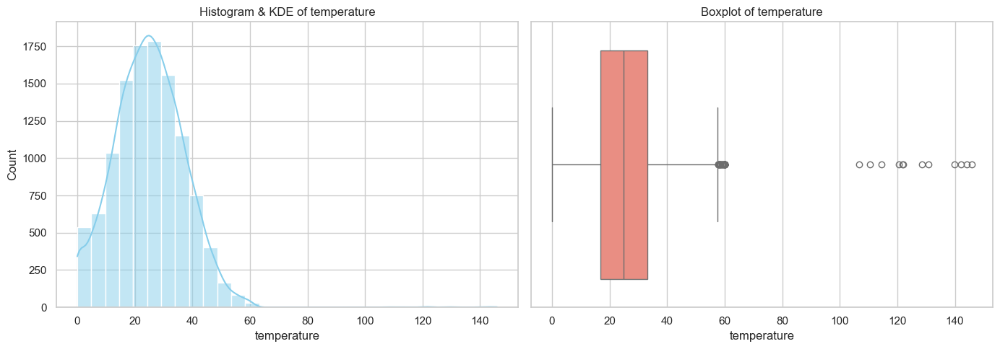

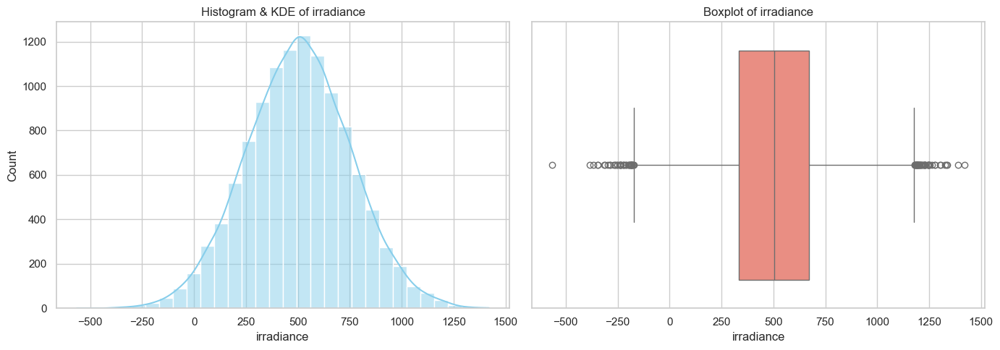

In [ ]:
# Univariate Analysis (Single Variable)
import matplotlib.pyplot as plt
import seaborn as sns

# Set Seaborn style
sns.set_theme(style="whitegrid")


numerical_cols = ['temperature','irradiance','humidity','panel_age','maintenance_count','soiling_ratio','voltage','current','module_temperature','cloud_coverage','wind_speed','pressure']

# convert columns to numeric, coercing errors to NaN
train_df['humidity'] = pd.to_numeric(test_df['humidity'], errors='coerce')
train_df['wind_speed'] = pd.to_numeric(test_df['wind_speed'], errors='coerce')
train_df['pressure'] = pd.to_numeric(test_df['pressure'], errors='coerce')

# Plot histograms with KDE and boxplots
for col in numerical_cols:
    plt.figure(figsize=(14, 5))

    # Histogram with KDE
    plt.subplot(1, 2, 1)
    sns.histplot(test_df[col], kde=True, bins=30, color='skyblue')
    plt.title(f'Histogram & KDE of {col}')

    # Boxplot
    plt.subplot(1, 2, 2)
    sns.boxplot(x=test_df[col], color='salmon')
    plt.title(f'Boxplot of {col}')

    plt.tight_layout()
    plt.show()


